# Tutorial - Run DE on Gli3-KO dataset

## Load libraries & Setup config

In [1]:
%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format = 'svg' 

In [2]:
import os
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import delnx as dx
import matplotlib.pyplot as plt
from pathlib import Path

## Load data

In [3]:
# Set data directory
data_dir = "/projects/site/pred/ihb-g-deco/PUBLIC_DATA/scg/brain_organoids/FleckTreutlein2022"
data_dir = Path(data_dir)

In [4]:
adata = sc.read(data_dir / "GLI3_KO_45d.h5ad")

adata.obs["batch"] = adata.obs["organoid"].astype(str)
adata.obs["cell_type"] = adata.obs["cell_type"].astype(str)
adata.obs["condition"] = adata.obs["GLI3_KO"].astype(str)
adata = adata[~adata.obs["cell_type"].isin(["ctx_ip", "ctx_ex", "ctx_npc"])]

adata.layers["counts"] = adata.X.copy() #Store raw counts in a separate layer

/tmp/ipykernel_3684124/1542518449.py:8: ImplicitModificationWarning: Setting element `.layers['counts']` of view, initializing view as actual.
  adata.layers["counts"] = adata.X.copy() #Store raw counts in a separate layer


In [5]:
# Some basic preprocessing
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [6]:
adata

AnnData object with n_obs × n_vars = 19844 × 18653
    obs: 'organoid', 'GLI3_KO', 'cell_type', 'batch', 'condition'
    uns: 'log1p'
    obsm: 'pca', 'umap'
    layers: 'counts'

In [7]:
sc.pl.umap(adata, color=["condition", "cell_type"])

... storing 'cell_type' as categorical
... storing 'batch' as categorical
... storing 'condition' as categorical


## Pseudobulking

In [8]:
use_precompute=True

if use_precompute:
    adata_pb = sc.read(data_dir / "GLI3_KO_45d_pseudobulk.h5ad")

    adata_pb.obs["batch"] = adata_pb.obs["organoid"].astype(str)
    adata_pb.obs["cell_type"] = adata_pb.obs["cell_type"].astype(str)
    adata_pb.obs["condition"] = adata_pb.obs["GLI3_KO"].astype(str)
else:
    adata_pb = dx.pp.pseudobulk(
        adata,
        sample_key="batch",  # Sample key for pseudobulk aggregation (the biological replicate)
        group_key="cell_type",  # Group key for pseudobulk aggregation
        n_pseudoreps=2,  # Optionally, the data can be split into multiple pseudoreplicates. This can be useful if the number of actual biological replicates is low.
        layer="counts",  # Layer to use for pseudobulk aggregation, e.g. "counts" or None for adata.X
        mode="sum",
    )
    
    adata_pb.layers["counts"] = adata_pb.X.copy()

    adata_pb = adata_pb[
        ~adata_pb.obs["cell_type"].isin(["ctx_ip", "ctx_ex", "ctx_npc"])
    ].copy()

## Perform DE

In [9]:
# Compute size factors
dx.pp.size_factors(adata_pb, method="ratio")

# Estimate dispersion parameters
dx.pp.dispersion(adata_pb, size_factor_key="size_factor", method="deseq2")

  0%|          | 0/8 [00:00<?, ?it/s]INFO:2025-06-23 17:29:46,838:jax._src.xla_bridge:752: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2025-06-23 17:29:46 | [INFO] Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2025-06-23 17:29:46 | [WARNING] An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.
100%|██████████| 8/8 [00:12<00:00,  1.54s/it]


In [10]:
# Run differential expression analysis
results = dx.tl.de(
    adata_pb,
    condition_key="condition",
    group_key="cell_type",
    mode="all_vs_ref",
    reference="False",
    method="negbinom",
    layer="counts",
    size_factor_key="size_factor",
    dispersion_key="dispersion",
)

Inferred data type: counts
14462 features passed log2fc threshold of 0.0


100%|██████████| 8/8 [00:09<00:00,  1.13s/it]


Inferred data type: counts
14906 features passed log2fc threshold of 0.0


100%|██████████| 8/8 [00:05<00:00,  1.34it/s]


Inferred data type: counts
15320 features passed log2fc threshold of 0.0


100%|██████████| 8/8 [00:05<00:00,  1.40it/s]


Inferred data type: counts
15443 features passed log2fc threshold of 0.0


100%|██████████| 8/8 [00:06<00:00,  1.28it/s]


In [11]:
dx.pp.label_de_genes(results, coef_thresh=0.5)

/pstore/data/ihb-g-deco/USERS/adaml9/miniforge3/envs/delnx/lib/python3.13/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [12]:
results.head()

,feature,test_condition,ref_condition,group,log2fc,auroc,coef,pval,padj,-log10(pval),separation,significant
0,NONO,True,False,ge_in,0.695529,0.916667,0.479918,0.0,0.0,50.0,0.416667,NS
1,SKP1,True,False,ge_in,0.518251,0.916667,0.357677,0.0,0.0,50.0,0.416667,NS
2,SH3BGRL,True,False,ge_in,1.612293,1.000000,1.114956,0.0,0.0,50.0,0.500000,Up
3,MCL1,True,False,ge_in,1.176181,1.000000,0.809116,0.0,0.0,50.0,0.500000,Up
4,SVBP,True,False,ge_in,0.625077,0.916667,0.431592,0.0,0.0,50.0,0.416667,NS


## Plot volcano plot

In [13]:
de_results = results[results["group"]=="ge_in"].copy()

dx.pl.volcanoplot(de_results, label_top=5, coef_thresh=0.5)

## Get differentially expressed genes

In [14]:
de_genes_dict = dx.pp.get_de_genes(results)

#### Intersect all differentially expressed genes

In [15]:
# Extract all "up" gene sets from the dictionary
up_gene_sets = [set(v["up"]) for v in de_genes_dict.values()]

# Compute the intersection of all sets
common_up_genes = list(set.intersection(*up_gene_sets))

## Plot heatmap of shared differentially expressed genes

In [16]:
condition_colors = dict(zip(
    adata.obs["condition"].cat.categories,
    adata.uns["condition_colors"]
))

cell_type_colors = dict(zip(
    adata.obs["cell_type"].cat.categories,
    adata.uns["cell_type_colors"]
))

palette = {
    "condition": condition_colors,
    "cell_type": cell_type_colors
}

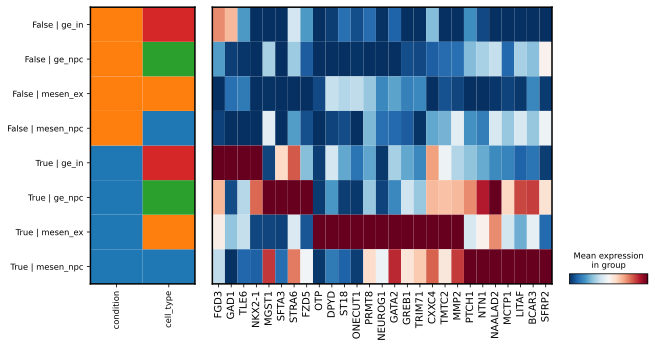

In [17]:
# Plot for single-cell data
fig = dx.pl.matrixplot(
        adata,
        var_names=common_up_genes,
        groupby=["condition", "cell_type"],
        cmap="RdBu_r",
        annotation_palette=palette,
        standard_scale="var",
        vmin=0,
        vmax=1,
        figsize=(10,5),
        show_row_names=True,
        show_col_names=True,
        return_fig=True,  # required for testability
        show=False,       # prevent blocking
        dendrogram=False
    )
fig.show()

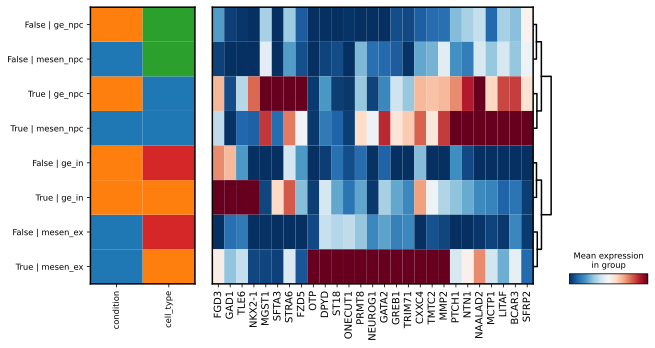

In [18]:
# Plot for single-cell data
fig = dx.pl.matrixplot(
        adata,
        var_names=common_up_genes,
        groupby=["condition", "cell_type"],
        cmap="RdBu_r",
        annotation_palette=palette,
        standard_scale="var",
        vmin=0,
        vmax=1,
        figsize=(10,5),
        show_row_names=True,
        show_col_names=True,
        return_fig=True,  # required for testability
        show=False,       # prevent blocking
        dendrogram=True
    )
fig.show()

In [19]:
def get_pseudobulk_avg(adata, de_genes):
    """
    Computes pseudobulk averages for a given list or set of genes across condition and cell type.

    Parameters:
    - adata: AnnData object (pseudobulk or aggregated data)
    - de_genes: list or set of gene names to extract (e.g. upregulated DE genes)

    Returns:
    - DataFrame with averaged expression values grouped by 'condition | cell_type'
    """
    
    # Ensure all requested genes are present in adata
    valid_genes = [g for g in de_genes if g in adata.var_names]

    # Add metadata keys
    genes_and_meta = valid_genes + ["condition", "cell_type"]

    # Extract expression data with metadata
    mat = sc.get.obs_df(adata, keys=genes_and_meta)

    # Group and average
    mat_avg = mat.groupby(["condition", "cell_type"]).mean()

    # Join index levels with " | "
    mat_avg.index = mat_avg.index.map(lambda x: f"{x[0]} | {x[1]}")

    return mat_avg

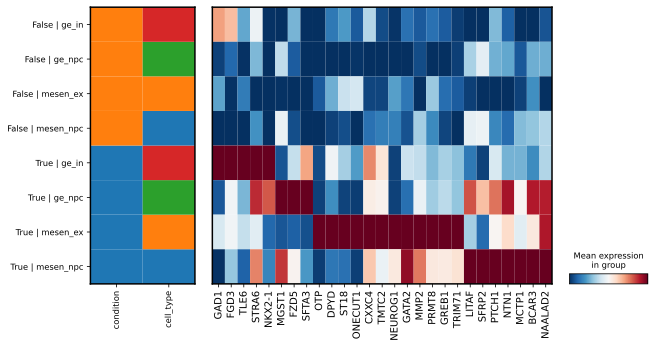

In [20]:
# Plot for pseudobulk data
fig = dx.pl.matrixplot(
        adata,
        var_names=common_up_genes,
        groupby=["condition", "cell_type"],
        values_df = get_pseudobulk_avg(adata_pb, common_up_genes),
        cmap="RdBu_r",
        standard_scale="var",
        annotation_palette=palette,
        vmin=0,
        vmax=1,
        figsize=(10,5),
        show_row_names=True,
        show_col_names=True,
        return_fig=True,  # required for testability
        show=False,       # prevent blocking
        dendrogram=False
    )
fig.show()

## Perform gene set enrichment analysis

In [21]:
# Run enrichment
enr_results = dx.tl.run_de_enrichment_analysis(results[results["group"]=="ge_in"], cutoff=0.1)

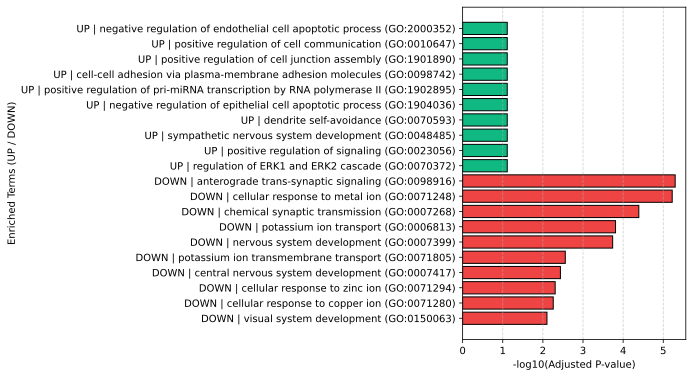

(<Figure size 400x600 with 1 Axes>,
 <Axes: xlabel='-log10(Adjusted P-value)', ylabel='Enriched Terms (UP / DOWN)'>)

In [22]:
dx.pl.gsea_barplot(enr_results, figsize=(4,6))

## Run Enrichment Analysis on Gene Set

In [23]:
enr_results = dx.tl.run_single_enrichment_analysis(genes=common_up_genes)

In [24]:
enr_results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2021,embryonic axis specification (GO:0000578),3/18,0.000002,0.000751,0,0,166.316667,2203.143557,FZD5;PTCH1;CXXC4
1,GO_Biological_Process_2021,positive regulation of transcription by RNA po...,8/908,0.000018,0.003672,0,0,8.923041,97.500900,SFRP2;FZD5;ONECUT1;NKX2-1;GATA2;NEUROG1;LITAF;...
2,GO_Biological_Process_2021,negative regulation of signal transduction (GO...,5/267,0.000026,0.003672,0,0,17.098369,180.565434,SFRP2;PTCH1;GATA2;CXXC4;NTN1
3,GO_Biological_Process_2021,regulation of transcription by RNA polymerase ...,11/2206,0.000069,0.006327,0,0,5.568280,53.320782,SFRP2;FZD5;PTCH1;ONECUT1;NKX2-1;OTP;GATA2;NEUR...
4,GO_Biological_Process_2021,smooth muscle tissue development (GO:0048745),2/10,0.000078,0.006327,0,0,199.650000,1887.299561,PTCH1;STRA6
